# Gabriel Scarin
# Hotel canellations test
# Date: 2022-03-16


### In case to install some libraries use:
`` pip install pandas``<br>
`` pip install pandas-proffiling``<br>
`` pip install seaborn``<br>
`` pip install matplotlib``<br>

### Some times in MacOS, ligthGBM has an error, I solved the problem running:
`` conda install lightgbm``<br>

### Importing Libraries

In [73]:
import os
import pandas as pd
import numpy as np
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt

from pycaret.classification import *
from pycaret.utils import check_metric

%matplotlib inline
os.chdir('/Users/gabrielscarin/Desktop/Gabriel/Projetos/py_teste')

### Readind dataset

In [3]:
df = pd.read_csv('cancellation_prediction.csv')

In [4]:
df.head()

,type,cancellation,days_between_booking_arrival,year_arrival_date,month_arrival_date,week_number_arrival_date,day_of_month_arrival_date,num_weekend_nights,num_workweek_nights,num_adults,num_children,num_babies,breakfast,country,market_segment,distribution_channel,repeated_guest,num_previous_cancellations,num_previous_stays,reserved_room,changes_between_booking_arrival,deposit_policy,id_travel_agency_booking,id_person_booking,customer_type,avg_price,required_car_parking_spaces,total_of_special_requests
0,Fancy Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,True,PRT,0,0,0,0,0,C,3,No Deposit,NaN,NaN,0,0.0,0,0
1,Fancy Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,True,PRT,0,0,0,0,0,C,4,No Deposit,NaN,NaN,0,0.0,0,0
2,Fancy Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,True,GBR,0,0,0,0,0,A,0,No Deposit,NaN,NaN,0,75.0,0,0
3,Fancy Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,True,GBR,1,1,0,0,0,A,0,No Deposit,304.0,NaN,0,75.0,0,0
4,Fancy Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,True,GBR,2,2,0,0,0,A,0,No Deposit,240.0,NaN,0,98.0,0,1


In [120]:
print("dataframe has: " + str(df.shape[0]) + " rows")
print("dataframe has: " + str(df.shape[1]) + " columns")

dataframe has: 119390 rows
dataframe has: 29 columns


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 28 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   type                             119390 non-null  object 
 1   cancellation                     119390 non-null  int64  
 2   days_between_booking_arrival     119390 non-null  int64  
 3   year_arrival_date                119390 non-null  int64  
 4   month_arrival_date               119390 non-null  object 
 5   week_number_arrival_date         119390 non-null  int64  
 6   day_of_month_arrival_date        119390 non-null  int64  
 7   num_weekend_nights               119390 non-null  int64  
 8   num_workweek_nights              119390 non-null  int64  
 9   num_adults                       119390 non-null  int64  
 10  num_children                     119386 non-null  float64
 11  num_babies                       119390 non-null  int64  
 12  br

### Checking null variables

In [7]:
df.isnull().sum()

type                                    0
cancellation                            0
days_between_booking_arrival            0
year_arrival_date                       0
month_arrival_date                      0
week_number_arrival_date                0
day_of_month_arrival_date               0
num_weekend_nights                      0
num_workweek_nights                     0
num_adults                              0
num_children                            4
num_babies                              0
breakfast                               0
country                               488
market_segment                          0
distribution_channel                    0
repeated_guest                          0
num_previous_cancellations              0
num_previous_stays                      0
reserved_room                           0
changes_between_booking_arrival         0
deposit_policy                          0
id_travel_agency_booking            16340
id_person_booking                 

In [8]:
df.describe()

,cancellation,days_between_booking_arrival,year_arrival_date,week_number_arrival_date,day_of_month_arrival_date,num_weekend_nights,num_workweek_nights,num_adults,num_children,num_babies,market_segment,distribution_channel,repeated_guest,num_previous_cancellations,num_previous_stays,changes_between_booking_arrival,id_travel_agency_booking,id_person_booking,customer_type,avg_price,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,2.467577,1.702019,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,0.469512,101.718744,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,1.420967,0.681400,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,0.836030,47.823771,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,7.000000,4.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,3.000000,300.000000,8.000000,5.000000


### Generating Pandas Profilling Report in HTML

In [9]:
profile = pandas_profiling.ProfileReport(df)

In [10]:
profile.to_file('render.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
profile

#### Creating an new column in order to analyze

In [12]:
df["ano_mes"] = df.year_arrival_date.map(str) + df.month_arrival_date

### Plotting canellations

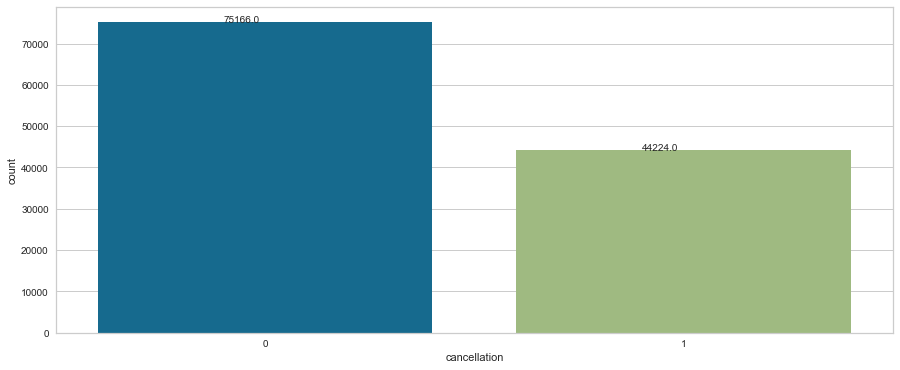

In [13]:
fig, ax = plt.subplots(figsize = (15,6))
g = sns.countplot(data = df,x = 'cancellation')

for p in g.patches:
    g.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.02))

plt.show()

### Plotting Cancellations X Year in order to indentify if there is any anommaly

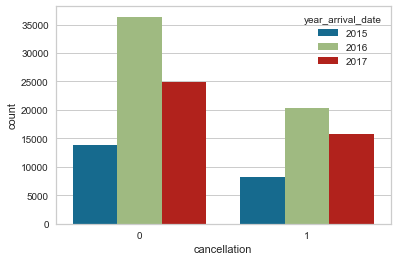

In [14]:
x = sns.countplot(x="cancellation", hue="year_arrival_date", data=df)


### Plotting Cancellations X Ano_mes in order to indentify if there is any anommaly between year and months

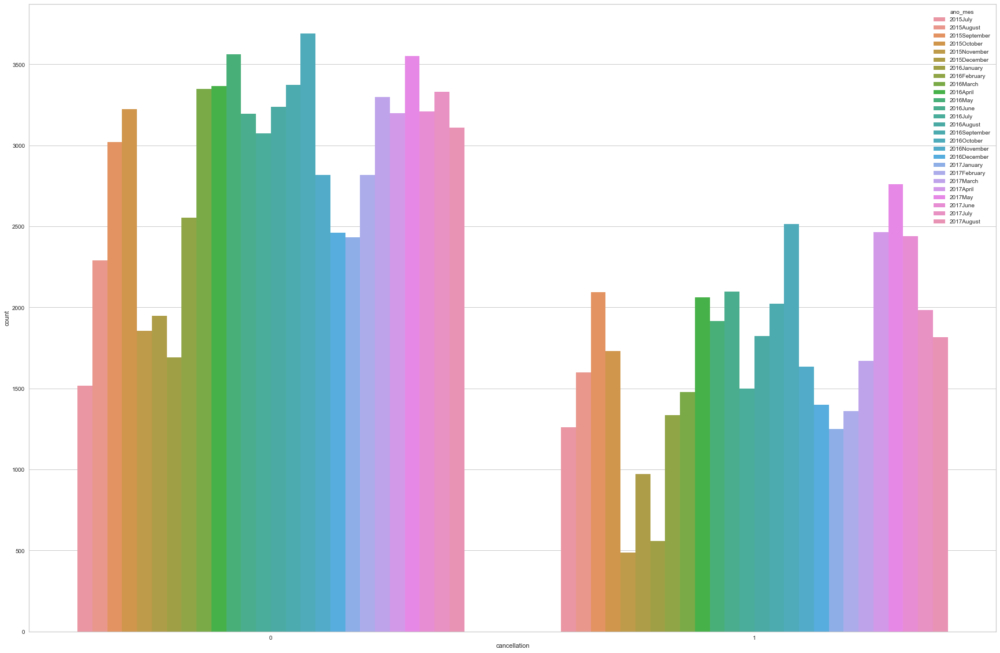

In [15]:
fig, ax = plt.subplots(figsize = (30,20))

x = sns.countplot(x="cancellation", hue="ano_mes", data=df)


### In my exploratory analysis, I thought that children and babies could be an identifier for having a cancellation, but it isn't true

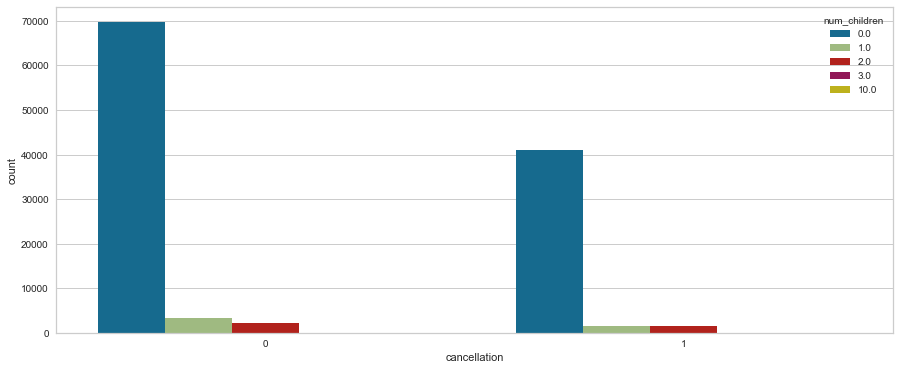

In [16]:
fig, ax = plt.subplots(figsize = (15,6))

x = sns.countplot(x="cancellation", hue="num_children", data=df)


### In my exploratory analysis, I thought that deposits identifier for having a cancellation, and when the policy is NON REFUND, there is higer cancellations

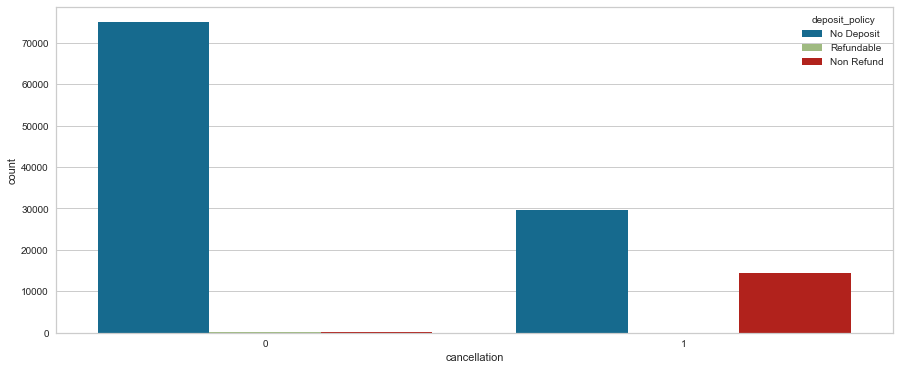

In [17]:
fig, ax = plt.subplots(figsize = (15,6))

x = sns.countplot(x="cancellation", hue="deposit_policy", data=df)

plt.show()

### Hotel type is normal

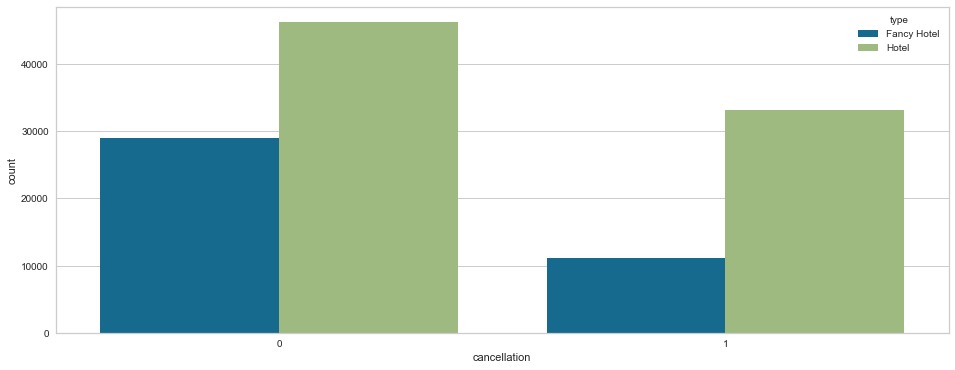

In [18]:

fig, ax = plt.subplots(figsize = (16,6))

x = sns.countplot(x="cancellation", hue="type", data=df)

plt.show()

### Now, checking countries, we can see that Portugal has the highest number of cancellations

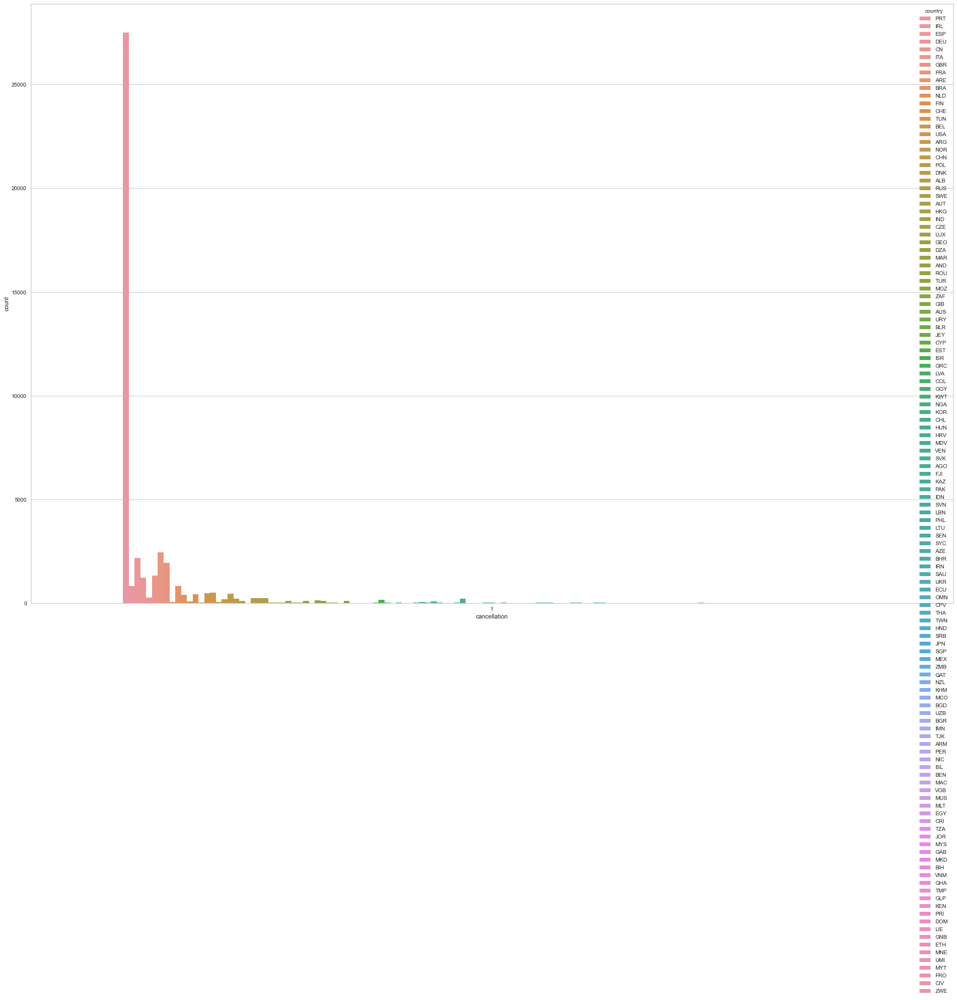

In [19]:

fig, ax = plt.subplots(figsize = (30,20))

x = sns.countplot(x="cancellation", hue="country", data=df[(df.cancellation == 1)])

plt.show()

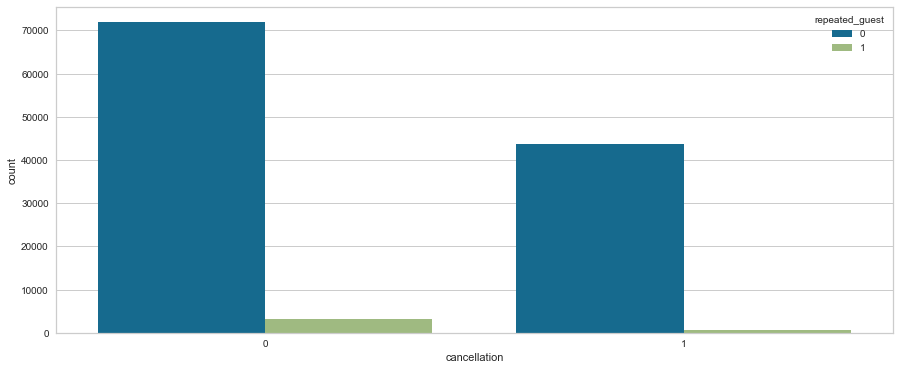

In [20]:


fig, ax = plt.subplots(figsize = (15,6))

x = sns.countplot(x="cancellation", hue="repeated_guest", data=df)

plt.show()

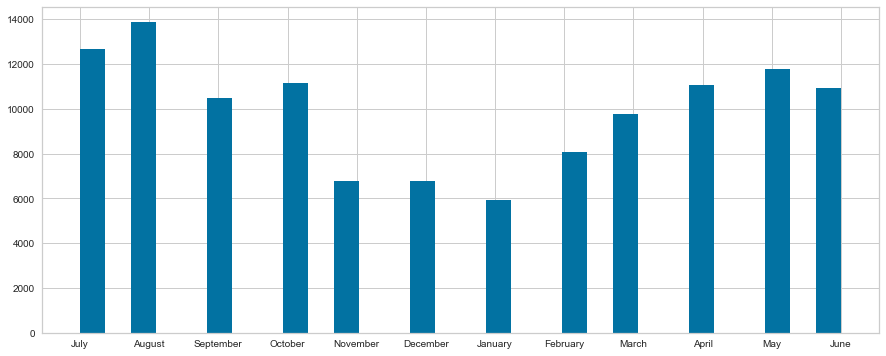

In [21]:
## Grafico de Quantidade de Custo Mensal

fig, ax = plt.subplots(figsize=(15, 6))
df.month_arrival_date.hist(bins=30, figsize=(15, 6), ax=ax)
plt.show()

### Selection columns to drop and creating new dataframe

In [22]:
df.columns

Index(['type', 'cancellation', 'days_between_booking_arrival',
       'year_arrival_date', 'month_arrival_date', 'week_number_arrival_date',
       'day_of_month_arrival_date', 'num_weekend_nights',
       'num_workweek_nights', 'num_adults', 'num_children', 'num_babies',
       'breakfast', 'country', 'market_segment', 'distribution_channel',
       'repeated_guest', 'num_previous_cancellations', 'num_previous_stays',
       'reserved_room', 'changes_between_booking_arrival', 'deposit_policy',
       'id_travel_agency_booking', 'id_person_booking', 'customer_type',
       'avg_price', 'required_car_parking_spaces', 'total_of_special_requests',
       'ano_mes'],
      dtype='object')

In [23]:
columns_to_drop = ['days_between_booking_arrival',
       'year_arrival_date', 'month_arrival_date', 'week_number_arrival_date',
       'day_of_month_arrival_date','distribution_channel','id_travel_agency_booking', 'id_person_booking','changes_between_booking_arrival','ano_mes']

In [24]:
df_new = df.drop(columns_to_drop,axis = 1)


In [25]:
df_new

,type,cancellation,num_weekend_nights,num_workweek_nights,num_adults,num_children,num_babies,breakfast,country,market_segment,repeated_guest,num_previous_cancellations,num_previous_stays,reserved_room,deposit_policy,customer_type,avg_price,required_car_parking_spaces,total_of_special_requests
0,Fancy Hotel,0,0,0,2,0.0,0,True,PRT,0,0,0,0,C,No Deposit,0,0.00,0,0
1,Fancy Hotel,0,0,0,2,0.0,0,True,PRT,0,0,0,0,C,No Deposit,0,0.00,0,0
2,Fancy Hotel,0,0,1,1,0.0,0,True,GBR,0,0,0,0,A,No Deposit,0,75.00,0,0
3,Fancy Hotel,0,0,1,1,0.0,0,True,GBR,1,0,0,0,A,No Deposit,0,75.00,0,0
4,Fancy Hotel,0,0,2,2,0.0,0,True,GBR,2,0,0,0,A,No Deposit,0,98.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,Hotel,0,2,5,2,0.0,0,True,BEL,3,0,0,0,A,No Deposit,0,96.14,0,0
119386,Hotel,0,2,5,3,0.0,0,True,FRA,2,0,0,0,E,No Deposit,0,225.43,0,2
119387,Hotel,0,2,5,2,0.0,0,True,DEU,2,0,0,0,D,No Deposit,0,157.71,0,4
119388,Hotel,0,2,5,2,0.0,0,True,GBR,2,0,0,0,A,No Deposit,0,104.40,0,0


In [125]:
print("The new dataframe has: " + str(df_new.shape[0]) + " rows")
print("The new dataframe has: " + str(df_new.shape[1]) + " columns")

The new dataframe has: 118902 rows
The new dataframe has: 19 columns


In [27]:
df_new.isnull().sum()

type                             0
cancellation                     0
num_weekend_nights               0
num_workweek_nights              0
num_adults                       0
num_children                     4
num_babies                       0
breakfast                        0
country                        488
market_segment                   0
repeated_guest                   0
num_previous_cancellations       0
num_previous_stays               0
reserved_room                    0
deposit_policy                   0
customer_type                    0
avg_price                        0
required_car_parking_spaces      0
total_of_special_requests        0
dtype: int64

#### Dropping rows with null country

In [28]:


df_new.dropna(subset=['country'],inplace = True)

In [29]:
df_new.shape

(118902, 19)

#### Creating a 95% dataset to tain/test an 5% set for validation

In [47]:

data = df_new.sample(frac = 0.95)

data_validation = df_new.drop(data.index)

data.reset_index(inplace = True, drop = True)
data_validation.reset_index(inplace = True, drop = True)

In [48]:
print("Dados de modelagem: " + str(data.shape))
print("Dados de validação: " + str(data_validation.shape))


Dados de modelagem: (112957, 19)
Dados de validação: (5945, 19)


In [49]:
data


,type,cancellation,num_weekend_nights,num_workweek_nights,num_adults,num_children,num_babies,breakfast,country,market_segment,repeated_guest,num_previous_cancellations,num_previous_stays,reserved_room,deposit_policy,customer_type,avg_price,required_car_parking_spaces,total_of_special_requests
0,Hotel,0,0,2,2,0.0,0,False,ITA,2,0,0,0,A,No Deposit,0,189.00,0,0
1,Fancy Hotel,1,2,5,2,0.0,0,True,GBR,2,0,0,0,D,No Deposit,2,88.20,0,0
2,Hotel,1,1,4,2,0.0,0,False,ESP,2,0,0,0,A,No Deposit,0,109.65,0,0
3,Fancy Hotel,0,0,1,1,0.0,0,True,PRT,2,0,0,0,A,No Deposit,2,52.80,0,0
4,Hotel,0,0,2,2,0.0,0,False,DEU,3,0,0,0,A,No Deposit,2,115.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112952,Fancy Hotel,1,2,1,2,0.0,0,True,PRT,5,0,0,0,A,No Deposit,2,70.00,0,0
112953,Hotel,0,2,1,2,0.0,0,True,FRA,2,0,0,0,A,No Deposit,0,106.20,0,0
112954,Hotel,1,2,5,1,0.0,0,False,PRT,5,0,1,0,A,Non Refund,0,79.43,0,0
112955,Hotel,0,0,2,2,0.0,0,False,DEU,3,0,0,0,A,No Deposit,2,109.00,0,0


# Setting Pycaret

In [51]:

exp = setup(data = data, target = 'cancellation', 
            feature_selection=True, remove_outliers=True,
             bin_numeric_features=["avg_price"])

,Description,Value
0,session_id,4124
1,Target,cancellation
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(112957, 19)"
5,Missing Values,True
6,Numeric Features,3
7,Categorical Features,15
8,Ordinal Features,False
9,High Cardinality Features,False


## Using AUC to select models

In [52]:
best_model = compare_models(sort = 'auc')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8301,0.9104,0.7012,0.8169,0.7546,0.6258,0.6301,0.6070
rf,Random Forest Classifier,0.8357,0.9089,0.7392,0.8040,0.7703,0.6427,0.6441,10.0920
gbc,Gradient Boosting Classifier,0.8145,0.8963,0.6491,0.8153,0.7228,0.5860,0.5947,11.6390
et,Extra Trees Classifier,0.8313,0.8830,0.7280,0.8011,0.7628,0.6323,0.6341,10.7220
lr,Logistic Regression,0.7987,0.8819,0.6094,0.8030,0.6929,0.5474,0.5589,4.7610
ada,Ada Boost Classifier,0.7952,0.8791,0.6027,0.7984,0.6869,0.5391,0.5509,3.9190
lda,Linear Discriminant Analysis,0.7975,0.8779,0.5689,0.8353,0.6768,0.5370,0.5580,1.6680
knn,K Neighbors Classifier,0.8061,0.8693,0.7172,0.7512,0.7338,0.5814,0.5818,67.7160
dt,Decision Tree Classifier,0.8147,0.8287,0.7272,0.7642,0.7452,0.5998,0.6003,0.5270
nb,Naive Bayes,0.5773,0.8046,0.8818,0.4646,0.6086,0.2353,0.2956,0.1520


## Best Model is Light Gradient Boosting Machine having the best AUC and 3rd best Accurary

In [53]:
print(best_model)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=4124, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [55]:
## Criando o modelo
lg = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8361,0.9141,0.7042,0.8302,0.7620,0.6384,0.6434
1,0.8261,0.9058,0.6942,0.8120,0.7485,0.6169,0.6213
2,0.8303,0.9123,0.6999,0.8183,0.7545,0.6260,0.6305
3,0.8377,0.9172,0.7193,0.8230,0.7677,0.6439,0.6473
4,0.8220,0.9042,0.6839,0.8090,0.7412,0.6070,0.6120
5,0.8314,0.9144,0.7120,0.8125,0.7589,0.6302,0.6335
6,0.8301,0.9110,0.6899,0.8256,0.7517,0.6241,0.6299
7,0.8280,0.9097,0.7003,0.8123,0.7521,0.6215,0.6255
8,0.8280,0.9082,0.7028,0.8105,0.7528,0.6219,0.6256
9,0.8310,0.9069,0.7060,0.8159,0.7569,0.6285,0.6324


In [56]:
print(lg)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=4124, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


## Plotting model features and cross validation

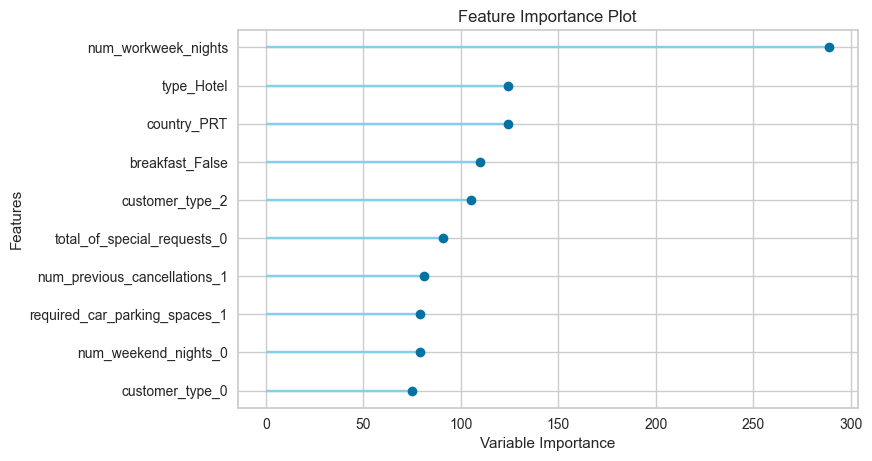

In [57]:
plot_model(lg, plot = 'feature')

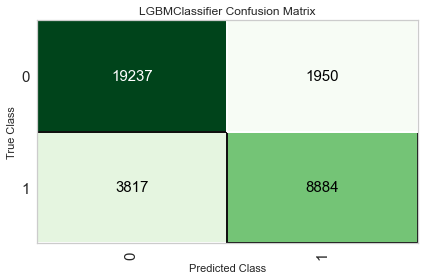

In [58]:
plot_model(lg, plot = 'confusion_matrix')

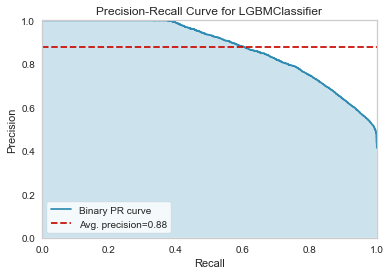

In [59]:
plot_model(lg, plot='pr')

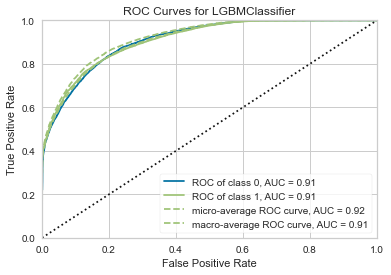

In [60]:
plot_model(lg, plot="auc")

### Predicting Model

In [61]:
predict_model(lg)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8298,0.9100,0.6995,0.8200,0.7550,0.6259,0.6305


,country_BRA,type_Hotel,country_BEL,country_ROU,avg_price_14.0,avg_price_7.0,num_weekend_nights_2,avg_price_13.0,total_of_special_requests_3,avg_price_9.0,...,country_CHN,country_CHE,country_AUT,avg_price_6.0,num_adults_1,country_FIN,num_workweek_nights,cancellation,Label,Score
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0,0,0.9957
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0,0,0.7247
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0,0,0.9996
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.8999
4,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.7148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33883,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1,1,0.5209
33884,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0,0,0.9173
33885,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1,1,0.9996
33886,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,3.0,1,1,0.9991


### Predicting model usen 5% sub-set

In [63]:
validation_prediction = predict_model(lg, data = data_validation)
validation_prediction.head()

,type,cancellation,num_weekend_nights,num_workweek_nights,num_adults,num_children,num_babies,breakfast,country,market_segment,...,num_previous_cancellations,num_previous_stays,reserved_room,deposit_policy,customer_type,avg_price,required_car_parking_spaces,total_of_special_requests,Label,Score
0,Fancy Hotel,0,0,4,2,0.0,0,True,IRL,2,...,0,0,D,No Deposit,0,97.00,0,3,0,0.8047
1,Fancy Hotel,0,0,1,2,0.0,0,True,FRA,1,...,0,0,A,No Deposit,0,107.42,0,0,0,0.9060
2,Fancy Hotel,1,2,5,2,0.0,0,True,PRT,2,...,0,0,E,No Deposit,0,107.00,0,2,1,0.7836
3,Fancy Hotel,0,2,5,2,0.0,0,False,GBR,3,...,0,0,A,No Deposit,1,82.35,0,0,0,0.9964
4,Fancy Hotel,0,0,1,2,0.0,0,True,ESP,2,...,0,0,A,No Deposit,0,88.20,1,0,0,0.9996


In [71]:
print('Accuracy: ' + str(check_metric(validation_prediction['cancellation'],validation_prediction['Label'], metric = 'Accuracy')))
print('AUC: ' + str(check_metric(validation_prediction['cancellation'],validation_prediction['Label'], metric = 'AUC')))

Accuracy: 0.8212
AUC: 0.7918


## Finalizing model and saving into pickle

In [74]:
## FInalize
final_lg = finalize_model(lg)

In [75]:
#save

save_model(final_lg, 'Final_LGBM_Train_Test')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='cancellation',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric...
                  LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, importance_type='split',
                                 learning_rate=0.1, max_depth=-1,
               

## Reading the dataset again in order do make another model

In [78]:
df2 = pd.read_csv('cancellation_prediction.csv')


In [79]:
df2

,type,cancellation,days_between_booking_arrival,year_arrival_date,month_arrival_date,week_number_arrival_date,day_of_month_arrival_date,num_weekend_nights,num_workweek_nights,num_adults,...,num_previous_stays,reserved_room,changes_between_booking_arrival,deposit_policy,id_travel_agency_booking,id_person_booking,customer_type,avg_price,required_car_parking_spaces,total_of_special_requests
0,Fancy Hotel,0,342,2015,July,27,1,0,0,2,...,0,C,3,No Deposit,NaN,NaN,0,0.00,0,0
1,Fancy Hotel,0,737,2015,July,27,1,0,0,2,...,0,C,4,No Deposit,NaN,NaN,0,0.00,0,0
2,Fancy Hotel,0,7,2015,July,27,1,0,1,1,...,0,A,0,No Deposit,NaN,NaN,0,75.00,0,0
3,Fancy Hotel,0,13,2015,July,27,1,0,1,1,...,0,A,0,No Deposit,304.0,NaN,0,75.00,0,0
4,Fancy Hotel,0,14,2015,July,27,1,0,2,2,...,0,A,0,No Deposit,240.0,NaN,0,98.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,Hotel,0,23,2017,August,35,30,2,5,2,...,0,A,0,No Deposit,394.0,NaN,0,96.14,0,0
119386,Hotel,0,102,2017,August,35,31,2,5,3,...,0,E,0,No Deposit,9.0,NaN,0,225.43,0,2
119387,Hotel,0,34,2017,August,35,31,2,5,2,...,0,D,0,No Deposit,9.0,NaN,0,157.71,0,4
119388,Hotel,0,109,2017,August,35,31,2,5,2,...,0,A,0,No Deposit,89.0,NaN,0,104.40,0,0


## Train And Test using 2015 and 2016 Data
## And Validation using 2017 data

In [85]:
train_2015_2016 = df2.query('year_arrival_date != 2017')
validation_year_2017 = df2.query('year_arrival_date == 2017')

print('Using 2015 and 2016, train size is: ' + str(train_2015_2016.shape) )
print('Using 2017, validation is: '+ str(validation_year_2017.shape) )

Using 2015 and 2016, train size is: (78703, 28)
Using 2017, validation is: (40687, 28)


In [87]:
columns_to_drop2 = ['days_between_booking_arrival',
       'year_arrival_date', 'month_arrival_date', 'week_number_arrival_date',
       'day_of_month_arrival_date','distribution_channel','id_travel_agency_booking', 'id_person_booking','changes_between_booking_arrival']

In [88]:
train_2015_2016 = train_2015_2016.drop(columns_to_drop2,axis = 1)
validation_year_2017 = validation_year_2017.drop(columns_to_drop2,axis = 1)


In [90]:
validation_year_2017.isnull().sum()

type                            0
cancellation                    0
num_weekend_nights              0
num_workweek_nights             0
num_adults                      0
num_children                    0
num_babies                      0
breakfast                       0
country                        83
market_segment                  0
repeated_guest                  0
num_previous_cancellations      0
num_previous_stays              0
reserved_room                   0
deposit_policy                  0
customer_type                   0
avg_price                       0
required_car_parking_spaces     0
total_of_special_requests       0
dtype: int64

In [91]:
## dropando as linhas com pais nulo

train_2015_2016.dropna(subset=['country'],inplace = True)
validation_year_2017.dropna(subset=['country'],inplace = True)




### Setting the new model

In [99]:
## Creating Setup

exp_2017 = setup(data = train_2015_2016, target = 'cancellation', 
            feature_selection=True, remove_outliers=True,
             bin_numeric_features=["avg_price"])

,Description,Value
0,session_id,6085
1,Target,cancellation
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(78298, 19)"
5,Missing Values,True
6,Numeric Features,3
7,Categorical Features,15
8,Ordinal Features,False
9,High Cardinality Features,False


In [100]:
best_model_2 = compare_models(sort = 'auc')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8607,0.9320,0.7454,0.8540,0.7959,0.6909,0.6947,0.7760
rf,Random Forest Classifier,0.8664,0.9298,0.7801,0.8417,0.8097,0.7070,0.7082,4.9460
gbc,Gradient Boosting Classifier,0.8379,0.9164,0.6711,0.8528,0.7511,0.6334,0.6434,7.2830
et,Extra Trees Classifier,0.8614,0.9065,0.7708,0.8363,0.8022,0.6958,0.6972,7.6300
lr,Logistic Regression,0.8193,0.9010,0.6299,0.8336,0.7175,0.5884,0.6009,5.6600
ada,Ada Boost Classifier,0.8145,0.8988,0.6242,0.8242,0.7104,0.5777,0.5898,2.0250
lda,Linear Discriminant Analysis,0.8170,0.8965,0.5861,0.8691,0.7001,0.5754,0.5986,1.2660
knn,K Neighbors Classifier,0.8363,0.8926,0.7554,0.7869,0.7708,0.6435,0.6439,44.6950
dt,Decision Tree Classifier,0.8471,0.8561,0.7725,0.8010,0.7865,0.6674,0.6677,0.3720
nb,Naive Bayes,0.5986,0.8239,0.8817,0.4729,0.6156,0.2684,0.3279,0.1180


In [101]:
print(best_model_2)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=6085, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [102]:
## Criando o modelo
lg2 = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8540,0.9311,0.7292,0.8491,0.7846,0.6752,0.6796
1,0.8667,0.9312,0.7534,0.8635,0.8047,0.7043,0.7080
2,0.8596,0.9316,0.7460,0.8505,0.7948,0.6888,0.6922
3,0.8587,0.9304,0.7545,0.8414,0.7956,0.6880,0.6904
4,0.8661,0.9352,0.7613,0.8555,0.8057,0.7041,0.7069
5,0.8562,0.9291,0.7487,0.8393,0.7914,0.6822,0.6848
6,0.8531,0.9266,0.7260,0.8490,0.7827,0.6728,0.6775
7,0.8621,0.9330,0.7417,0.8606,0.7967,0.6932,0.6976
8,0.8648,0.9357,0.7517,0.8596,0.8020,0.7000,0.7037
9,0.8657,0.9361,0.7412,0.8711,0.8009,0.7006,0.7058


### Plotting features

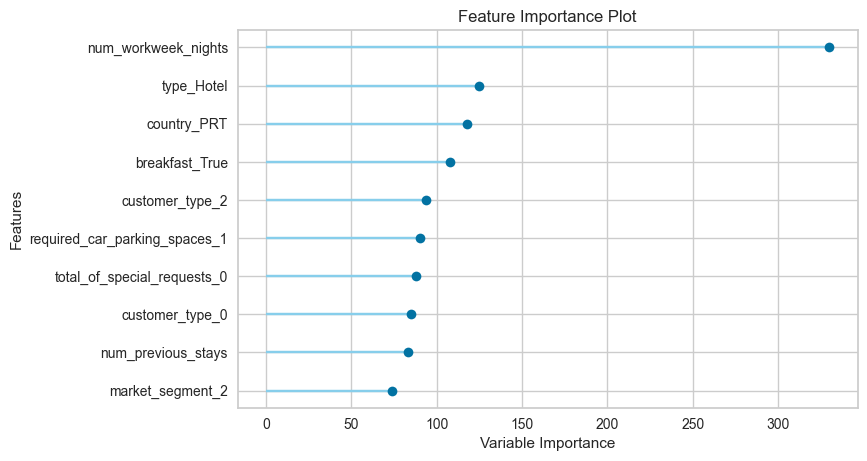

In [103]:
plot_model(lg2, plot = 'feature')

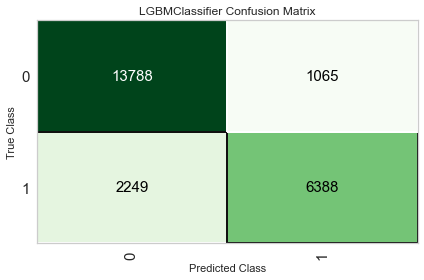

In [104]:
plot_model(lg2, plot = 'confusion_matrix')

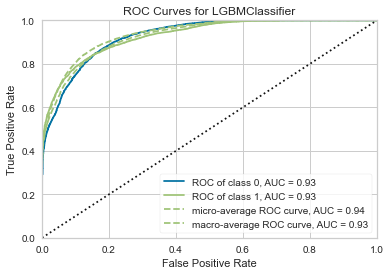

In [105]:
plot_model(lg2, plot="auc")

In [106]:
predict_model(lg2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8589,0.9297,0.7396,0.8571,0.7940,0.6876,0.6920


,country_BRA,type_Hotel,country_BEL,country_ROU,avg_price_14.0,avg_price_7.0,num_weekend_nights_2,avg_price_13.0,reserved_room_H,total_of_special_requests_3,...,country_CHN,country_CHE,country_AUT,avg_price_6.0,num_adults_1,country_FIN,num_workweek_nights,cancellation,Label,Score
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0,0,0.9970
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0,0.9868
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1,1,0.9992
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0,0,0.7557
4,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,1,0.5633
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23485,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,2.0,1,1,0.9992
23486,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0,0,0.7378
23487,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0,0,0.9896
23488,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0,0,0.9353


### Predicting using 2017 information

In [110]:
predict_2017 = predict_model(lg2, data=validation_year_2017)
predict_2017

,type,cancellation,num_weekend_nights,num_workweek_nights,num_adults,num_children,num_babies,breakfast,country,market_segment,...,num_previous_cancellations,num_previous_stays,reserved_room,deposit_policy,customer_type,avg_price,required_car_parking_spaces,total_of_special_requests,Label,Score
9775,Fancy Hotel,1,1,0,2,0.0,0,True,PRT,2,...,0,0,A,No Deposit,0,57.60,0,0,0,0.6369
9776,Fancy Hotel,1,2,2,2,0.0,0,True,AUT,2,...,0,0,A,No Deposit,0,51.50,0,1,0,0.7670
9777,Fancy Hotel,1,2,2,2,0.0,0,True,AUT,2,...,0,0,A,No Deposit,0,51.50,0,1,0,0.7670
9778,Fancy Hotel,1,2,2,2,0.0,0,True,AUT,2,...,0,0,A,No Deposit,0,51.50,0,1,0,0.7670
9779,Fancy Hotel,1,2,2,1,0.0,0,True,PRT,2,...,0,0,A,No Deposit,0,32.22,0,1,1,0.5540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,Hotel,0,2,5,2,0.0,0,True,BEL,3,...,0,0,A,No Deposit,0,96.14,0,0,0,0.9891
119386,Hotel,0,2,5,3,0.0,0,True,FRA,2,...,0,0,E,No Deposit,0,225.43,0,2,0,0.7703
119387,Hotel,0,2,5,2,0.0,0,True,DEU,2,...,0,0,D,No Deposit,0,157.71,0,4,0,0.7942
119388,Hotel,0,2,5,2,0.0,0,True,GBR,2,...,0,0,A,No Deposit,0,104.40,0,0,1,0.6673


## Validation Metrics

In [111]:
print('Accuracy: ' + str(check_metric(predict_2017['cancellation'],predict_2017['Label'], metric = 'Accuracy')))
print('AUC: ' + str(check_metric(predict_2017['cancellation'],predict_2017['Label'], metric = 'AUC')))

Accuracy: 0.7674
AUC: 0.7304


In [112]:
## finalizando o modelo
final_lg2 = finalize_model(lg2)

In [113]:
#salvando

save_model(final_lg2, 'Final_LGBM_Temporal')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='cancellation',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric...
                  LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, importance_type='split',
                                 learning_rate=0.1, max_depth=-1,
               

In [114]:
acc = check_metric(validation_prediction['cancellation'],validation_prediction['Label'], metric = 'Accuracy')
auc = check_metric(validation_prediction['cancellation'],validation_prediction['Label'], metric = 'AUC')
acc2017 = check_metric(predict_2017['cancellation'],predict_2017['Label'], metric = 'Accuracy')
auc2017 = check_metric(predict_2017['cancellation'],predict_2017['Label'], metric = 'AUC')

In [119]:
print('Using random train test split, LGBM had better Accuracy comparing to LGBM model using 2017 as validation.')
print('Accuracy random: '+ str(acc))
print('Accuracy temporal model: '+ str(acc2017))
print('\n So, in this case Random LGBM was the best one, but looking for year charts,cancellations seem to be seasonal. Maybe, an alternative to choose another model or,\
considering that LGBM it is the best one, an A/B Test could be applied in order to see both models performing in real life')

Using random train test split, LGBM had better Accuracy comparing to LGBM model using 2017 as validation.
Accuracy random: 0.8212
Accuracy temporal model: 0.7674

 So, in this case Random LGBM was the best one, but looking for year charts,cancellations seem to be seasonal. Maybe, an alternative to choose another model or,considering that LGBM it is the best one, an A/B Test could be applied in order to see both models performing in real life


# Thanks